Title - Data analysis of classifying Song Genres from Audio Data


Group No. -10

Team   

        1. Subhashini (22b0013)
        2. Tonali Gupta (22b0072)
        3. Ritika (22b0064)
        4. Anupchand yadav (22b0023)
        5. Abhrajyoti Majumder(22b0047)
        6. Vishal Gautam (22B0065)

Video link -https://drive.google.com/file/d/1r29eVWll6NdwDaEpyCsP6Csdltq6u4dy/view?usp=sharing

Dataset - The dataset we are using is compiled by The Echo Nest, a research group known for its music
analysis capabilities. It contains various features extracted from songs, such as tempo, energy,
danceability, and acousticness. Each song in the dataset is labeled as either 'Hip-Hop' or 'Rock',
serving as our ground truth for classification.

1. https://drive.google.com/file/d/1g1nG4n60a8wjICxGTp_AG1VkNSjQH8BN/view?usp=sharing

2. https://drive.google.com/file/d/1xC2Nw7LjIeb9SnN6BTwbcgWiQwTNmo51/view?usp=sharing

----------------------------------------------------------------------------------------------------------

Importing Libraries and Dataset

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import shapiro
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

label = pd.read_csv(r"/content/fma-rock-vs-hiphop.csv")
feature = pd.read_json(r"/content/echonest-metrics.json", precise_float = True)
df = pd.merge(feature, label[["track_id", "genre_top"]], on ='track_id')

Data Cleaning

In [ ]:
missing_values = df.isnull().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
track_id            0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
speechiness         0
tempo               0
valence             0
genre_top           0
dtype: int64


Since, there is no missing values in any column so our data is ready for analysis

Visualizing dataset

In [ ]:
df

,track_id,acousticness,danceability,energy,instrumentalness,liveness,speechiness,tempo,valence,genre_top
0,2,0.416675,0.675894,0.634476,1.062807e-02,0.177647,0.159310,165.922,0.576661,Hip-Hop
1,3,0.374408,0.528643,0.817461,1.851103e-03,0.105880,0.461818,126.957,0.269240,Hip-Hop
2,5,0.043567,0.745566,0.701470,6.967990e-04,0.373143,0.124595,100.260,0.621661,Hip-Hop
3,134,0.452217,0.513238,0.560410,1.944269e-02,0.096567,0.525519,114.290,0.894072,Hip-Hop
4,153,0.988306,0.255661,0.979774,9.730057e-01,0.121342,0.051740,90.241,0.034018,Rock
...,...,...,...,...,...,...,...,...,...,...
4797,124718,0.412194,0.686825,0.849309,6.000000e-10,0.867543,0.367315,96.104,0.692414,Hip-Hop
4798,124719,0.054973,0.617535,0.728567,7.215700e-06,0.131438,0.243130,96.262,0.399720,Hip-Hop
4799,124720,0.010478,0.652483,0.657498,7.098000e-07,0.701523,0.229174,94.885,0.432240,Hip-Hop
4800,124721,0.067906,0.432421,0.764508,1.625500e-06,0.104412,0.310553,171.329,0.580087,Hip-Hop


# **Exploratory Data Analysis (EDA)**

1.**Distribution plot of each features**

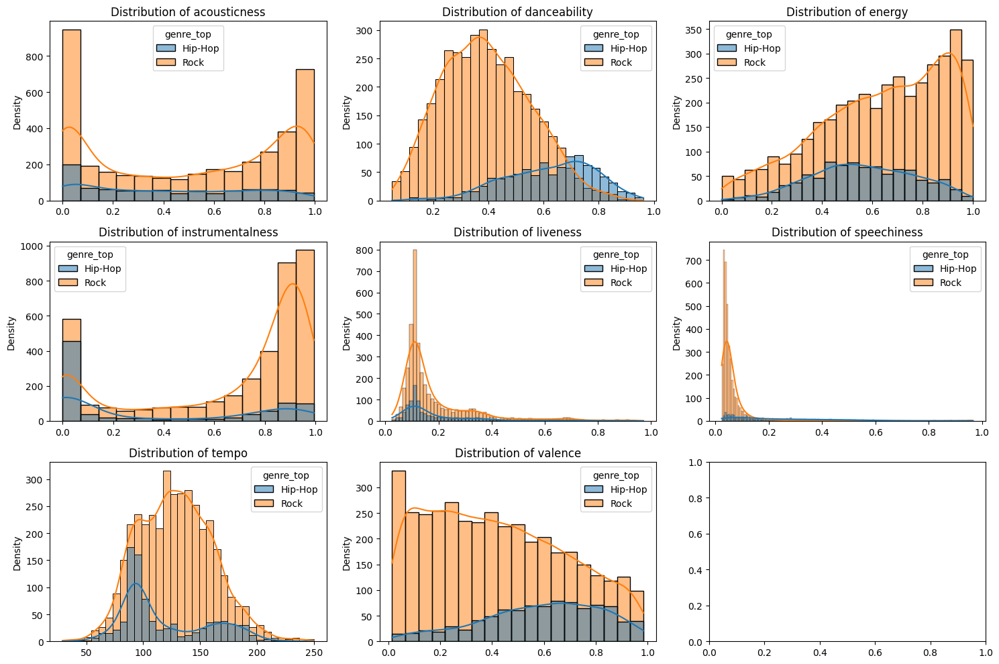

In [ ]:

# Set up the figure grid
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of features to plot
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence']

# Iterate over features and plot distribution plots
for i, feature in enumerate(features):
    sns.histplot(data=df, x=feature, hue='genre_top', ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.show()

2.**Genrawise box plots**

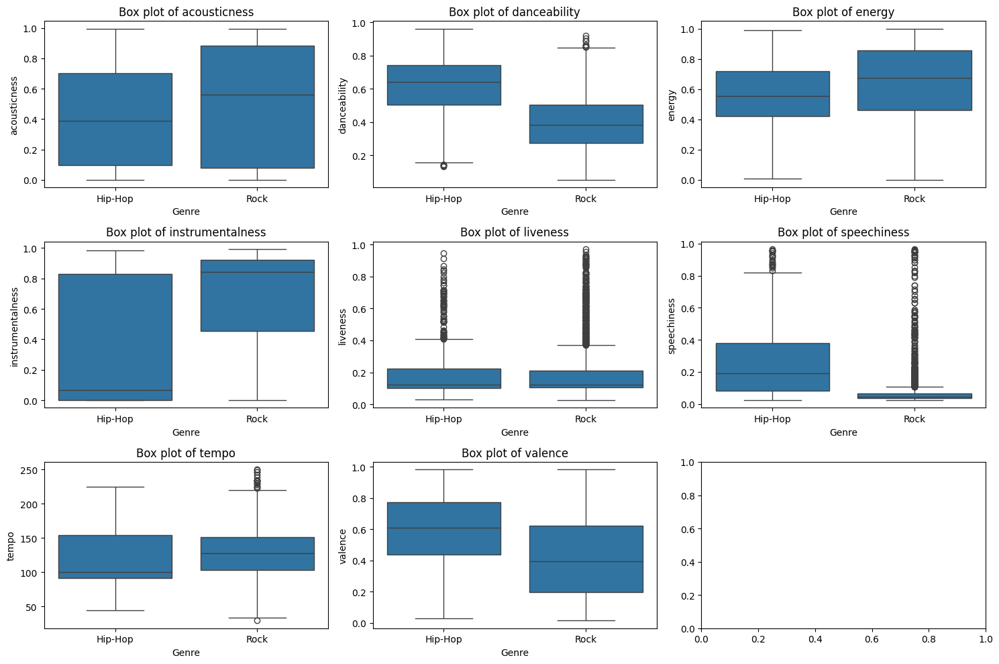

In [ ]:
# Set up the figure grid
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of features to plot
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence']

# Iterate over features and plot box plots
for i, feature in enumerate(features):
    sns.boxplot(data=df, x='genre_top', y=feature, ax=axes[i])
    axes[i].set_title(f'Box plot of {feature}')
    axes[i].set_xlabel('Genre')
    axes[i].set_ylabel(feature)

# Adjust layout
plt.tight_layout()
plt.show()

3.**HIstogram and pie chart**

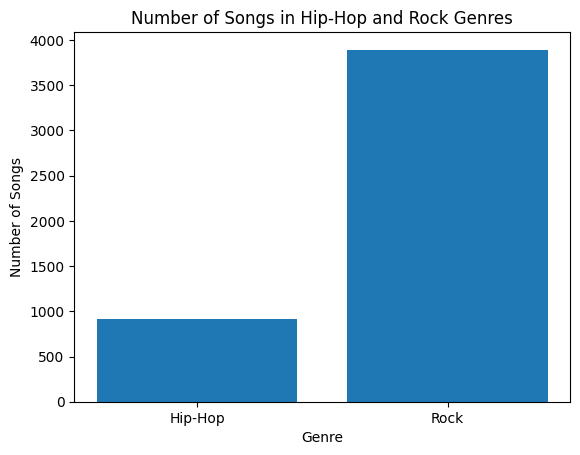

In [ ]:
# hip-hop and rock genres
hiphop_count = df[df['genre_top'] == 'Hip-Hop'].shape[0]
rock_count = df[df['genre_top'] == 'Rock'].shape[0]
# Create a histogram
plt.bar(['Hip-Hop', 'Rock'], [hiphop_count, rock_count])
plt.title('Number of Songs in Hip-Hop and Rock Genres')
plt.xlabel('Genre')
plt.ylabel('Number of Songs')
plt.show()

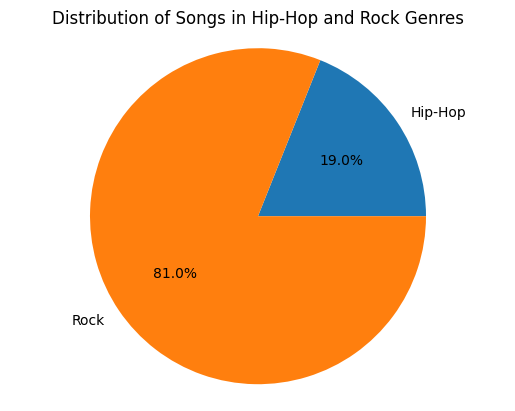

In [ ]:
# Create a pie chart
labels = ['Hip-Hop', 'Rock']
sizes = [hiphop_count, rock_count]
plt.pie(sizes, labels=labels, autopct='%1.1f%%')
plt.title('Distribution of Songs in Hip-Hop and Rock Genres')
plt.axis('equal')
plt.show()

4. **Pairwise distribution of features**

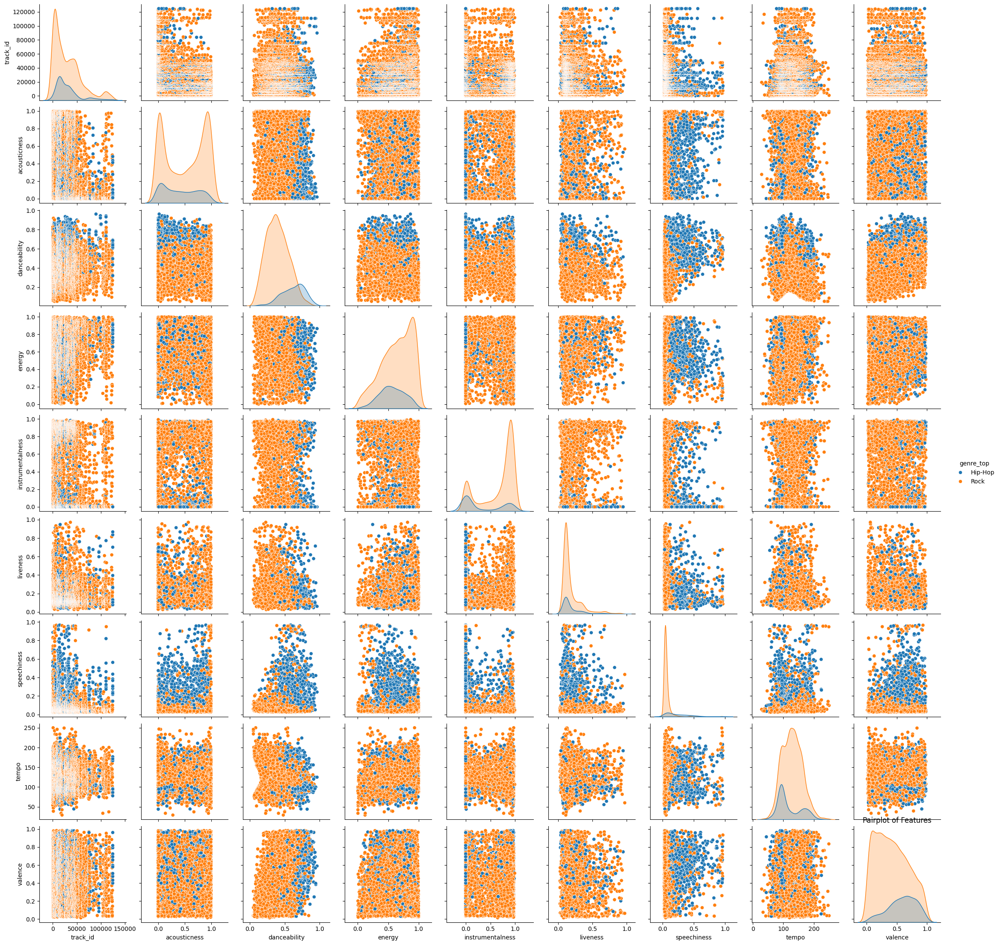

In [ ]:
sns.pairplot(df, hue='genre_top', diag_kind='kde')
plt.title('Pairplot of Features')
plt.show()

5. 2D distribution of features with other featrues

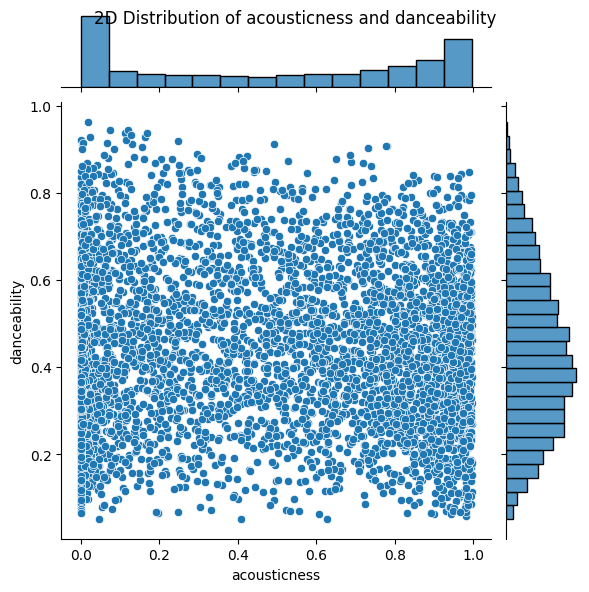

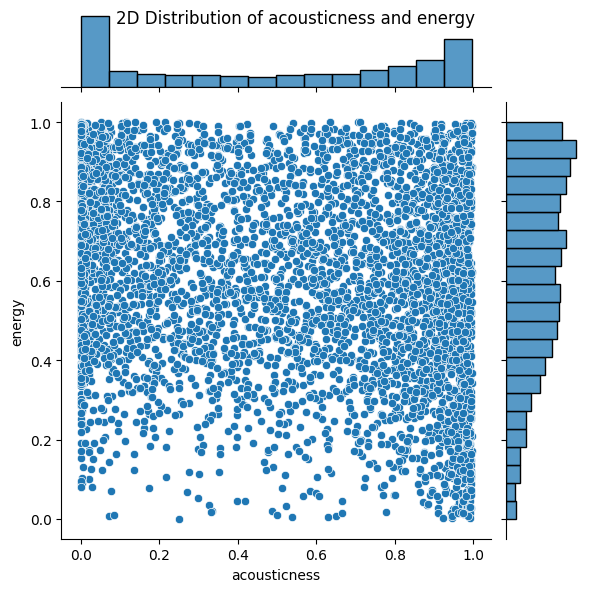

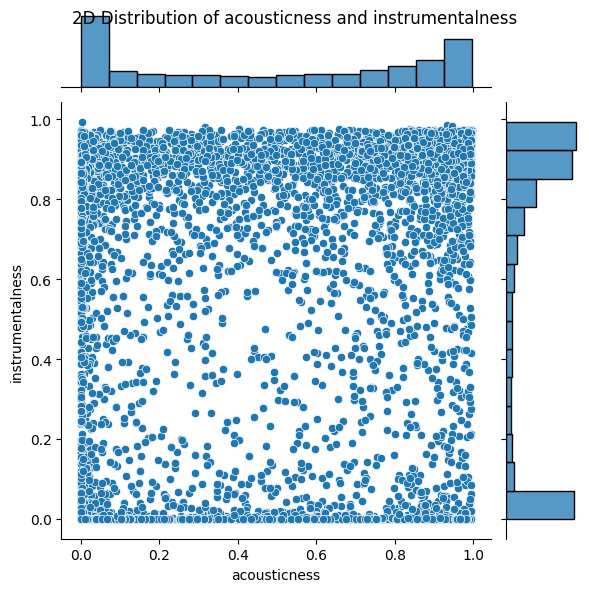

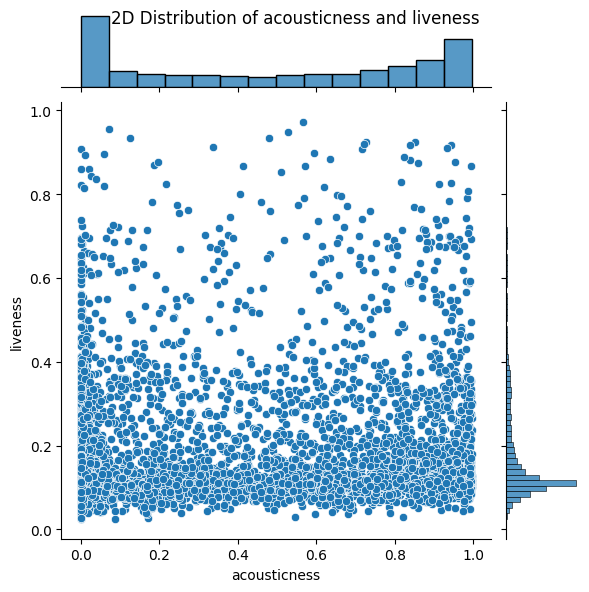

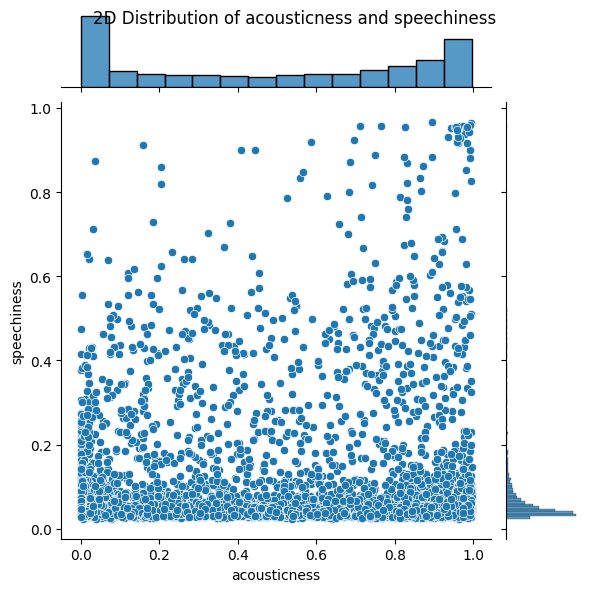

...

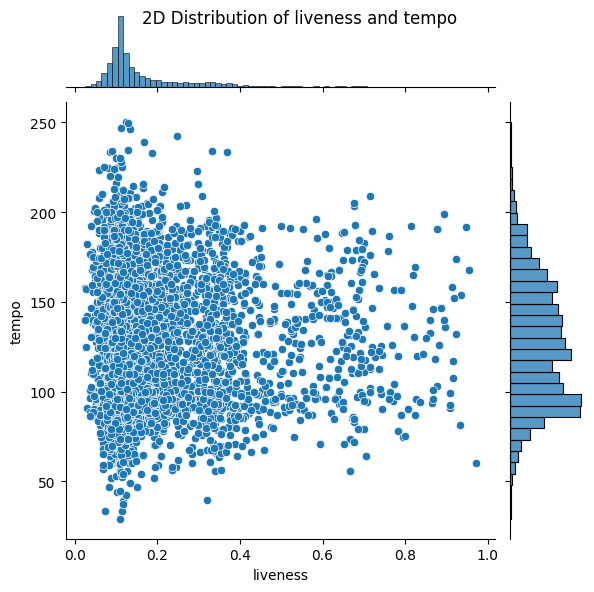

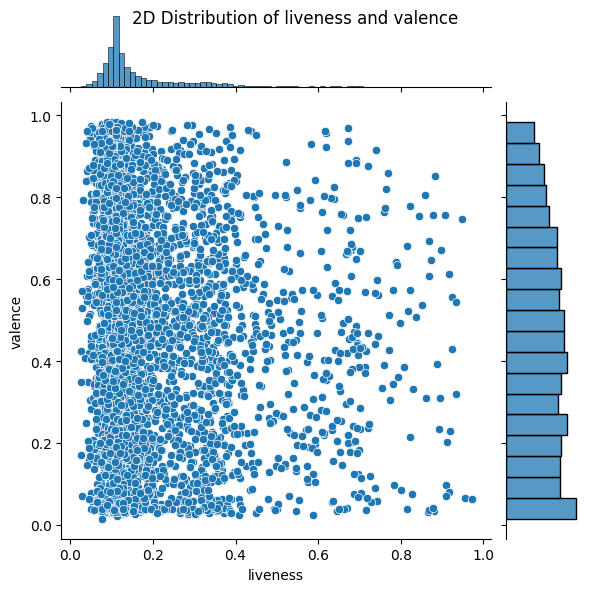

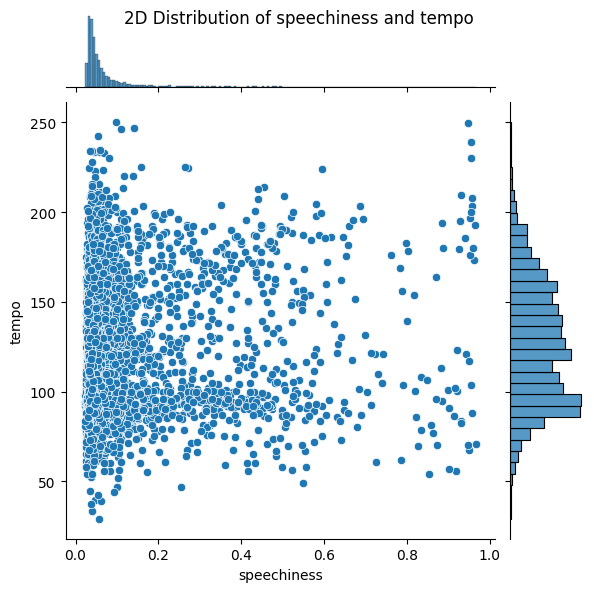

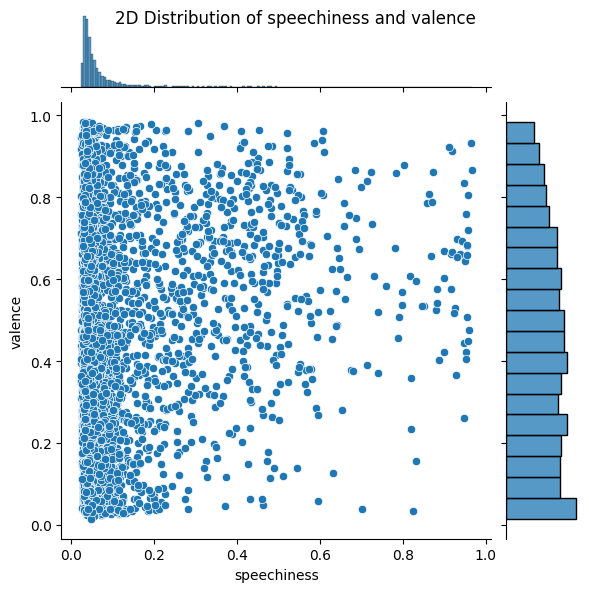

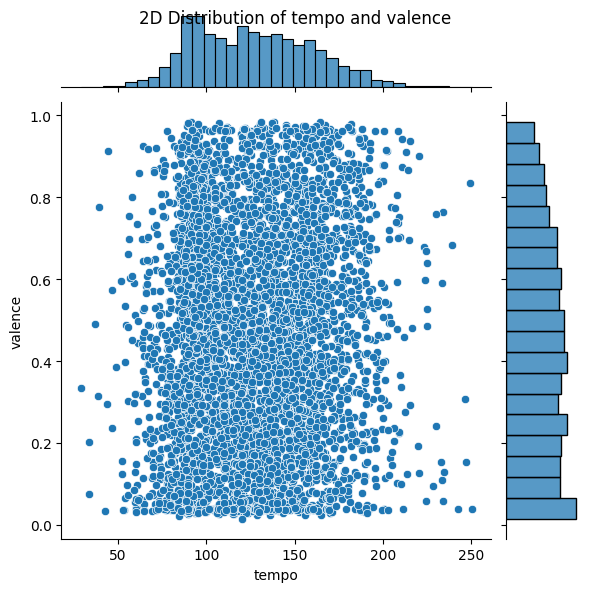

In [ ]:
# List of features to plot
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence']

# Iterate over pairs of features and plot joint plots
for i, feature1 in enumerate(features):
    for j, feature2 in enumerate(features):
        if i < j:  # Ensure only unique pairs are considered
            sns.jointplot(data=df, x=feature1, y=feature2, kind='scatter')
            plt.suptitle(f'2D Distribution of {feature1} and {feature2}')
            plt.show()

# **Identifying and analyzing the relationship between any two suitable variables**

**1. Identifying the Two Random Variables (Features) suitable for analysis**

We want to avoid variables that have strong correlations with each other, hence avoiding feature redundancy.

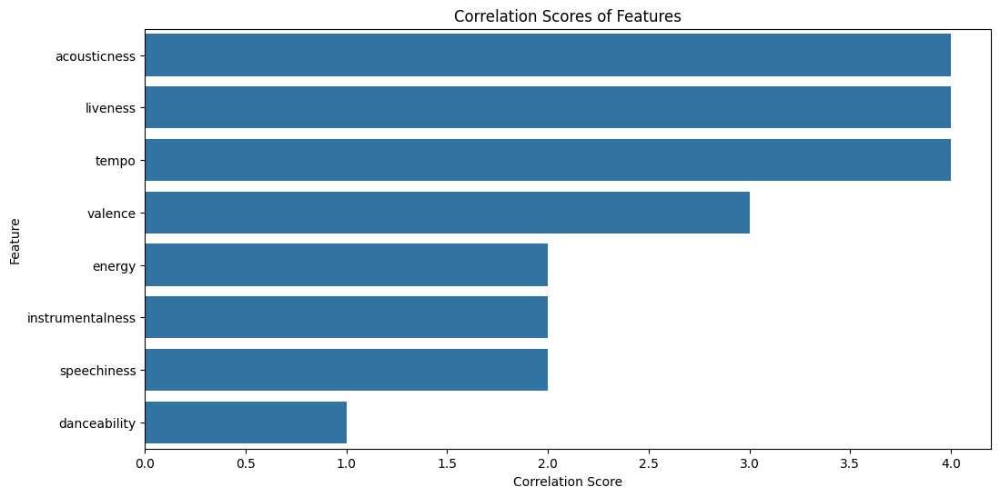

In [ ]:

column = df.columns.tolist()[1:9] # Contains list of features
df_feature = df.iloc[:,1:9] # Dataset containing only feature

correlation_scores = []

correlation_threshold = 0.05

for feature in column:

  # Calculating the Pearson correlation with all other features
  coorelations = df_feature.drop(columns = [feature]).corrwith(df_feature[feature], method = 'pearson')

  # Counting the number of correlations below the threshold
  below_threshold = (coorelations.abs() < correlation_threshold).sum()
  correlation_scores.append(below_threshold)

scores_df = pd.DataFrame({
    'Feature': column,
    'Correlation_Score': correlation_scores
})

# Plotting a bar chart using seaborn for visualisation
plt.figure(figsize=(12, 6))
sns.barplot(x='Correlation_Score', y='Feature', data=scores_df.sort_values(by='Correlation_Score', ascending=False))
plt.title('Correlation Scores of Features')
plt.xlabel('Correlation Score')
plt.ylabel('Feature')
plt.show()

In [ ]:
sorted_scores_df = scores_df.sort_values(by='Correlation_Score', ascending=False)
print(sorted_scores_df)

            Feature  Correlation_Score
0      acousticness                  4
4          liveness                  4
6             tempo                  4
7           valence                  3
2            energy                  2
3  instrumentalness                  2
5       speechiness                  2
1      danceability                  1


In [ ]:
# Comparison based on the Correlation _score
print("Top 2 features : Energy, Danceability")


Top 2 features : Energy, Danceability


2.Performing regression on these two variables
Y = BX + A, where Y - energy, X - danceability, A & B are estimators of alpha and beta

image.png

In [ ]:
# performing regression on these two variables
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
X = df['danceability'].values.reshape(-1,1)
Y = df['energy']
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2, random_state = 32)
model = LinearRegression()
model.fit(X_train, Y_train)

Y_pred = model.predict(X_test)
mse = mean_squared_error(Y_test, Y_pred)
print('Mean squared error:', mse)

Mean squared error: 0.05425968236569794


3.Point estimates for regression curve coefficients

In [ ]:
# Point estimates for regression curve coefficients
c = model.coef_
i = model.intercept_
print("Coeffcient: (beta)", c)
print("Intercept: (alpha)", i)

Coeffcient: (beta) [-0.32514378]
Intercept: (alpha) 0.7652399157386595


4.Interval estimates for regression curve coefficients

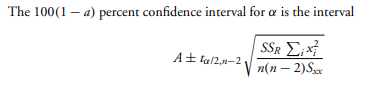

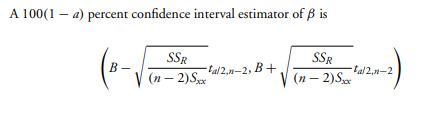

In [ ]:
# Interval estimates for regression curve coefficient
from scipy import stats

alpha = 0.05
n = len(X_train)

t_value = np.abs(stats.t.ppf(alpha/2, df=n-2))  # two-tailed t-value
s = np.sqrt(np.diag(np.linalg.inv(np.dot(X_train.T, X_train))))
lower_bound = c - t_value * s
upper_bound = c + t_value * s
print("Interval estimates for regression curve's coefficient (beta):")
print("(", lower_bound, ',', upper_bound, ")")
print(" ")

# Interval estimate for the intercept
s_i = np.sqrt(mse / (n - 2)) / np.sqrt(np.mean(X_train)**2)

t_value_intercept = np.abs(stats.t.ppf(alpha/2, df=n-2))  # two-tailed t-value

lower_bound_intercept = i - t_value_intercept * s_i
upper_bound_intercept = i + t_value_intercept * s_i
print("Interval Estimate for Intercept (alpha):")
print("(", lower_bound_intercept, ',', upper_bound_intercept, ")")


Interval estimates for regression curve's coefficient (beta):
( [-0.39220711] , [-0.25808045] )
 
Interval Estimate for Intercept (alpha):
( 0.7482776153933752 , 0.7822022160839437 )


5.Plotting Linear regression curve

3841


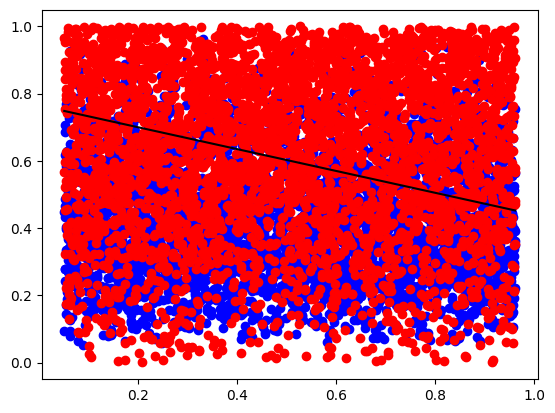

In [ ]:
slope = model.coef_[0]

intercept = model.intercept_

pts = np.linspace(min(X_train), max(X_train), 3841)

# Plot the data points
plt.scatter(pts, X_train, color = 'blue', label = 'Data Points')
plt.scatter(pts, Y_train, color = 'red', label = 'Data Points')
# Plot the regression line
x = np.linspace(min(X_train), max(X_train), 100)
y = slope*x+intercept
plt.plot(x,y,color = 'black', label = 'Regression Line')
print(len(Y_train))

# **Hypothesis Testing**

1.**we are going to analysis the hypothesis of two important features of our dataframes danceability and energy**
>
Does they have normal distribution or not?

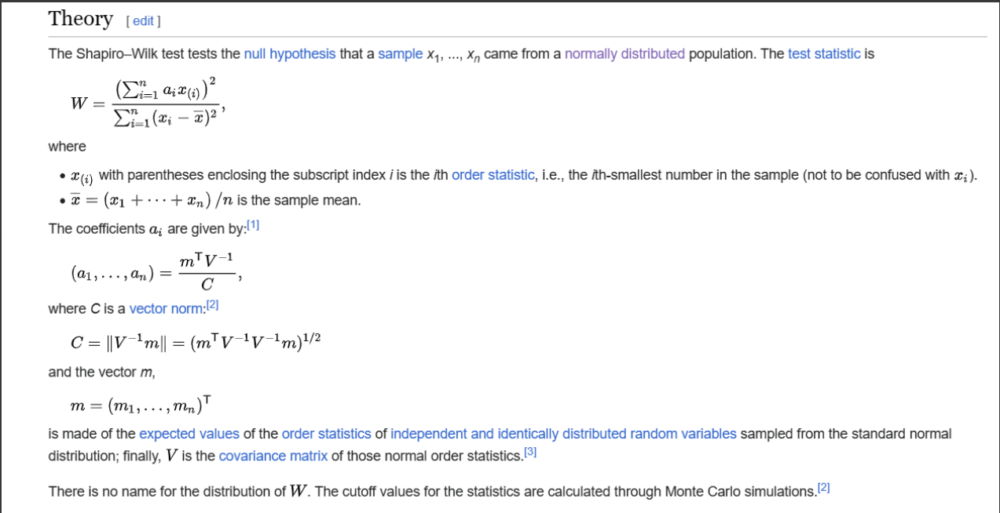

https://en.wikipedia.org/wiki/Shapiro%E2%80%93Wilk_test

limitestion of Shapiro-wilk test is dataset less then 5000

Hypothesis:
>
Null hypothesis (H0):danceability distribution is normal distribution
>
Alternative hypothesis(H1): danceability distribution is not normal distribution

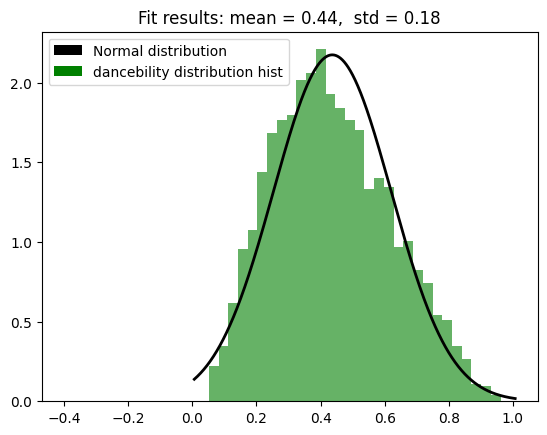

In [ ]:

# danceability data
data = df['danceability']

# Plot the histogram
plt.hist(data, bins=30, density=True, alpha=0.6,color='g')

# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(data), np.std(data))
plt.plot(x, p, 'k', linewidth=2)
# Assign colors to different genres (assuming 'genre_top' is a column in 'df')
colors = {'Normal distribution': 'black', 'dancebility distribution hist': 'green'}
labels = list(colors.keys())
# Add a block for each genre to the legend
for genre in labels:
    plt.bar(0, 0, color=colors[genre], label=genre)

# Add the legend to the plot
plt.legend(title='')



title = "Fit results: mean = %.2f,  std = %.2f" % (np.mean(data), np.std(data))
plt.title(title)

plt.show()

In [ ]:
# danceability hypothesis test
danceability_data = df['danceability']

# Perform the Shapiro-Wilk test
stat, p_value = shapiro(danceability_data)

# let significance level 0.05
alpha = 0.05
print(stat)
print(p_value)

0.9851143956184387
4.2244993368329136e-22


With the p-value being less than the conventional threshold of 0.05, we can reject the null hypothesis. This indicates that there is a statistically difference between a normal distribution and danceability distribution

Energy distribution hypothesis

Hypothesis:
>
Null hypothesis (H0): energy distribution is normal distribution
>
Alternative hypothesis(H1): energy distribution is not normal distribution

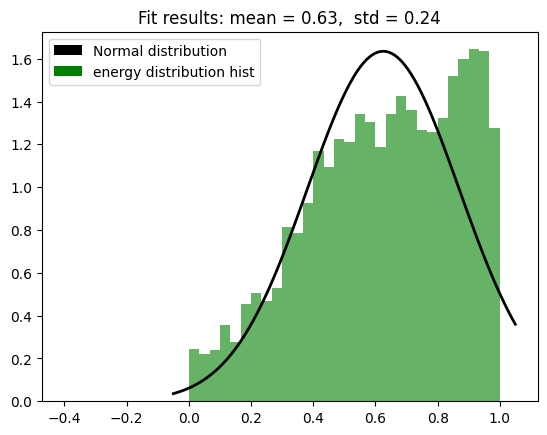

In [ ]:

# energy
data = df['energy']

# Plot the histogram
plt.hist(data, bins=30, density=True, alpha=0.6,color='g')

# Plot the PDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, np.mean(data), np.std(data))
plt.plot(x, p, 'k', linewidth=2)
# Assign colors to different genres (assuming 'genre_top' is a column in 'df')
colors = {'Normal distribution': 'black', 'energy distribution hist': 'green'}
labels = list(colors.keys())
# Add a block for each genre to the legend
for genre in labels:
    plt.bar(0, 0, color=colors[genre], label=genre)

# Add the legend to the plot
plt.legend(title='')

title = "Fit results: mean = %.2f,  std = %.2f" % (np.mean(data), np.std(data))
plt.title(title)

plt.show()

In [ ]:
# energy hypothesis test
energy_data = df['energy']

# Perform the Shapiro-Wilk test
stat, p_value = shapiro(energy_data)

#  significance level alpha
alpha = 0.05
print('stat =',stat)
print('p_value =',p_value)

stat = 0.9615552425384521
p_value = 6.673933920818329e-34


With the p-value being less than the conventional threshold of 0.05, we can reject the null hypothesis. This indicates that there is a statistically difference between a normal distribution and energy distribution

# **Coorelation**

1.**Correlation of each features (pairwise relationships between variables (features))**

<Axes: >

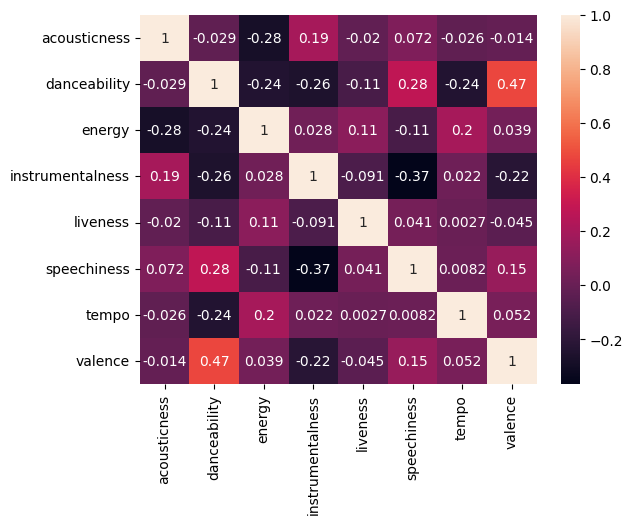

In [ ]:
#  Correlation Matrix

corr = df[['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence']].corr()
sns.heatmap(corr, annot = True)

# **Classification Models & Principal Component Analysis**

1.Splitting the data

In [ ]:
from sklearn.model_selection import train_test_split

# Features
features = df.drop(['genre_top', 'track_id'], axis = 1).values

# Labels
labels = df['genre_top'].replace({'Rock': 0, 'Hip-Hop': 1})

# Splitting the dataset
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.2, random_state=10)

2.Normalizing the feature data

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()

# Scale train_features and test_features
scaled_train_features = scaler.fit_transform(train_features)
scaled_test_features = scaler.transform(test_features)

3.Principal Component Analysis on the scaled data

Text(0.5, 0, 'Principal Component #')

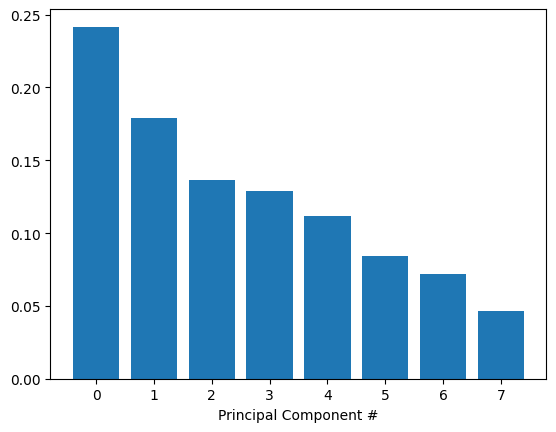

In [ ]:
# This is just to make plots appear in the notebook
%matplotlib inline

# Import PCA class
from sklearn.decomposition import PCA

# Get the explained variance ratios from PCA using all features
pca = PCA()
pca.fit(scaled_train_features)
exp_variance = pca.explained_variance_ratio_

# plot the explained variance using a barplot
fig, ax = plt.subplots()
ax.bar(range(8), exp_variance)
ax.set_xlabel('Principal Component #')

4.Visualization of PCA

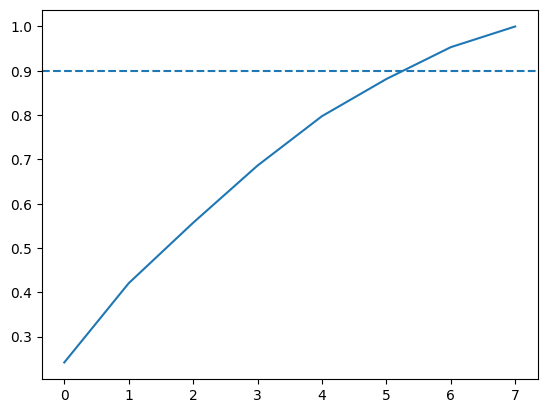

In [ ]:
# Import numpy
import numpy as np

# Calculate the cumulative explained variance
cum_exp_variance = np.cumsum(exp_variance)

# Plot the cumulative explained variance and draw a dashed line at 0.90.
fig, ax = plt.subplots()
ax.plot(range(8), cum_exp_variance)
ax.axhline(y=0.9, linestyle='--')

**5.Projecting on to the features**

We saw from the PCA plot that 6 features (remember indexing starts at 0) can explain 85% of the variance.

Therefore, we can use 6 components to perform PCA and reduce the dimensionality of the train and test features.

In [ ]:
# Perform PCA with the chosen number of components and project data onto components
pca = PCA(n_components = 6, random_state=10)

# Fit and transform the scaled training features using pca
train_pca = pca.fit_transform(scaled_train_features)

# Fit and transform the scaled test features using pca
test_pca = pca.transform(scaled_test_features)

**6.Deploying a decision tree to classify genre**

Here, we will be using a simple algorithm known as a decision tree. Decision trees are rule-based classifiers that take in features and follow a 'tree structure' of binary decisions to ultimately classify a data point into one of two or more categories. In addition to being easy to both use and interpret, decision trees allow us to visualize the 'logic flowchart' that the model generates from the training data

In [ ]:
# Import Decision tree classifier
from sklearn.tree import DecisionTreeClassifier

# Train our decision tree
tree = DecisionTreeClassifier(random_state=10)
tree.fit(train_pca, train_labels)

# Predict the labels for the test data
pred_labels_tree = tree.predict(test_pca)

7.Deploying Logistic Regression to classify genre

Logistic regression is a supervised machine learning algorithm used for classification tasks where the goal is to predict the probability that an instance belongs to a given class or not. Logistic regression is a statistical algorithm which analyze the relationship between two data factors.

It uses the sigmoid function to map the predicted values to probabilities.

In [ ]:
# Import LogisticRegression
from sklearn.linear_model import LogisticRegression

# Train our logistic regression and predict labels for the test set
logreg = LogisticRegression(max_iter = 1000, random_state=10)
logreg.fit(train_features, train_labels)
pred_labels_logit = logreg.predict(test_features)

 8.Comparison

 Decision Tree v/s Logistic Regression

In [ ]:

# Create the classification report for both models
from sklearn.metrics import classification_report
class_rep_tree = classification_report(test_labels, pred_labels_tree)
class_rep_log = classification_report(test_labels, pred_labels_logit)

print("Decision Tree: \n", class_rep_tree)
print("Logistic Regression: \n", class_rep_log)

Decision Tree: 
               precision    recall  f1-score   support

           0       0.91      0.91      0.91       783
           1       0.57      0.58      0.58       160

    accuracy                           0.85       943
   macro avg       0.74      0.75      0.74       943
weighted avg       0.86      0.85      0.86       943

Logistic Regression: 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95       783
           1       0.83      0.56      0.67       160

    accuracy                           0.91       943
   macro avg       0.87      0.77      0.81       943
weighted avg       0.90      0.91      0.90       943



7.Cross-validation to evaluate both models

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import Pipeline
tree_pipe = Pipeline([("scaler", StandardScaler()), ("pca", PCA(n_components=6)),
                      ("tree", DecisionTreeClassifier(random_state=10))])
logreg_pipe = Pipeline([("scaler", StandardScaler()), ("pca", PCA(n_components=6)),
                        ("logreg", LogisticRegression(random_state=10))])

# Set up our K-fold cross-validation
kf = KFold(10)

# Train our models using KFold cv
tree_score = cross_val_score(tree_pipe, features, labels, cv=kf)
logit_score = cross_val_score(logreg_pipe, features, labels, cv=kf)

# Print the mean of each array of scores
print("Decision Tree:", np.mean(tree_score), "Logistic Regression:", np.mean(logit_score))

Decision Tree: 0.8539975349958617 Logistic Regression: 0.8650050379646623
